# Projekt - Metody Eksploracji Danych - 2022Z <a name="W"></a>

<b>Autorzy:</b> Weronika Skiba (311465) i Daniel Ślusarczyk (311511)

## Spis Treści:
1. [Wstęp](#W)
1. [Opis projektu](#OP)
1. [Opis atrybutów](#OA)
1. [Analiza eksploracyjna danych](#AED)
    1. [Pobranie potrzebnych bibliotek](#PPB)
    1. [Utworzenie ramek danych](#URD)
    1. [Sprawdzenie brakujących danych](#SBD)
    1. [Informacje o zbiorze](#IOZ)
    1. [Analiza atrybutów bez odniesienia do diagnozy](#AABODJ)
    1. [Analiza atrybutów z odniesieniem do diagnozy](#AAZODJ)
    1. [Korelacja danych](#KD)
        1. [Macierz](#M)
        1. [Mapa Ciepła](#MC)
        1. [Wnioski](#W2)
1. [Bibliografia](#BIB)
    
<br>
<br>

**Opis projektu:** <br> <a id="OP"></a>
<h5>Cel Projektu:</h5>
Celem projektu jest dokładne przeanalizowanie zbioru danych o diagnozie raka piersi (z ang. "Breast Cancer") przeanalizowanych pacjentów.
<br>
<h5>Opis zbioru danych:</h5>
Zbiór danych zawiera dane dotyczące diagnozy raka piersi stworzony przez zespół naukowców na Uniwersytecie Wisconsin-Madison pod kierownictwem dr Williama H. Wolberga przy współudziale profesora W. Nicka Streeta i Olviego L. Mangasariana. Dane obejmują identyfikatory pacjentów, diagnozę raka piersi, oraz 30 szczegółowych cech wyodrębnionych z cyfrowego obrazu badania zwanego "Fine-needle aspiration (FNA)". Wiele z cech dotyczy szczegółowej wiedzy medycznej na temat raka.<br>
<br>

**Opis atrybutów:** <br> <a name="OA"></a>
* **Diagnoza** (z ang. *diagnosis*) - diagnoza typu raka: złośliwy lub łagodny
* **Promień** (z ang. *radius*) - średnia odległość od środka do punktów na obwodzie obrazu komórek raka.<br>
* **Tekstura** (z ang. *texture*) - odchylenie standardowe wartości w skali szarości.<br>
* **Obwód** (z ang. *perimeter*) <br>
* **Pole** (z ang. *area*) <br>
* **Gładkość** (z ang. *smoothness*) - szacowana na podstawie lokalnej zmiany długości promieni obrazu komórek raka.<br>
* **Zwartość** (z ang. *compactness*) -  liczona zgodnie ze wzorem: (Obwów ^ 2 / area - 1.0).<br>
* **Wklęsłość** (z ang. *concavity*) - nasilenie wklęsłych częsci konturu.<br>
* **Punkty wklęsłe** (z ang. *density*) - liczba wklęsłych punktów na konturze obrazu.<br>
* **Symetryczność** (z ang. *symmetry*) <br>
* **Wymiar fraktalny** (z ang. *fractal dimension*) <br>

Dodatkowo każdy atrybut został podany w trzech wariantach: średnia, błąd standardowy i najgorsza wartość na podstawie wyników badania dla jednego pacjenta. <br>
Zbiór zawiera również atrybyt opisujący id badanego pacjenta.

**<h3>Część 1</h3>** <a name="AED"></a>

**Analiza eksploracyjna danych:** <a name="AED"></a>

**Pobranie potrzebnych bibliotek:** <a name="PPB"></a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import neighbors
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

**Wczytanie danych:**

In [2]:
data = pd.read_csv('./datasets/breastcancer.csv')

**Utworzenie ramek danych:** <a name="URD"></a>

Usunięcie atrybutu o identyfikatorze pacjenta, który jest nieistotny z punktu widzenia analizy. Dodatkowo przekształcenie atrybutu o diagnozie na pełne nazwy pozwoli na łatwiejsze odczytywanie wyników analizy.

In [3]:
# Usunięcie atrybutu o id pacjenta - nieistotny z punktu widzenia analizy
data = data.drop("id", axis='columns')

# Przekształcenie diagnozy na pełne nazwy
data.loc[data["diagnosis"] == "M", "diagnosis"] = "malignant"
data.loc[data["diagnosis"] == "B", "diagnosis"] = "benign"

# Stworzenie ramki danych bez atrybutu decyzyjnego
plot_data = data.drop('diagnosis', axis='columns')

print(data.head())
print(plot_data.head())

   diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0  malignant        17.99         10.38          122.80     1001.0   
1  malignant        20.57         17.77          132.90     1326.0   
2  malignant        19.69         21.25          130.00     1203.0   
3  malignant        11.42         20.38           77.58      386.1   
4  malignant        20.29         14.34          135.10     1297.0   

   smoothness_mean  compactness_mean  concavity_mean  concave_points_mean  \
0          0.11840           0.27760          0.3001              0.14710   
1          0.08474           0.07864          0.0869              0.07017   
2          0.10960           0.15990          0.1974              0.12790   
3          0.14250           0.28390          0.2414              0.10520   
4          0.10030           0.13280          0.1980              0.10430   

   symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
0         0.2419  ...         25.38          

**Sprawdzenie brakujących danych:** <a name="SBD"></a>

In [181]:
# Liczba danych brakujących
missing_data = 0
for col in data:
    for item in data[col]:
        if(pd.isnull(item) == True):
            missing_data += 1
print("Liczba brakujących danych: %s" %(missing_data))

Liczba brakujących danych: 0


**Informacje o zbiorze:** <a name="IOZ"></a>

In [182]:
print(data.info())
# Liczba obiektów (obserwacji)
print("Liczba obiektów -", data.shape[0])
# Liczba atrybutów
print("Liczba atrybutów -", data.shape[1])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

**Analiza diagnozy (atrybut decyzyjny):** <a name="IOJ"></a>

Występujące diagnozy:  ['malignant' 'benign']
Rak łagodny: 357
Rak złośliwy:  212


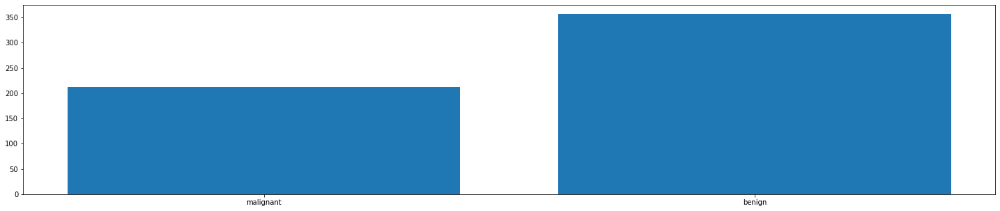

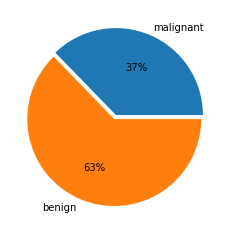

In [183]:
print("Występujące diagnozy: ", data.iloc[:, 0].unique())
freq = {"malignant": 0, "benign" : 0}

for diagnosis in data.iloc[:, 0]:
    freq[diagnosis] += 1

print("Rak łagodny:", freq['benign'])
print("Rak złośliwy: ", freq['malignant'])

plt.figure(figsize=(25,5))
plt.bar(freq.keys(), freq.values())
plt.show()

plt.pie(freq.values(), labels = freq.keys(), autopct = "%1.0f%%", explode=[0, 0.05])
plt.show()

Zbiór zawiera wyłącznie dwa rodzaje diagnoz raka: złośliwy i łagodny. Wyników badań stwierdzający złośliwy typ raka jest 357, a stwierdzających łagodny typ 212. Prowadzi to do wniosku, że dla badanej grupy testowej złośliwy typ raka był bardziej prawdopodobny i dotyczy 63% badanych.

**Informacje o atrybutach:** <a name="IOA"></a>

In [184]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


**Analiza atrybutów bez odniesienia do diagnozy:** <a name="AABODJ"></a>

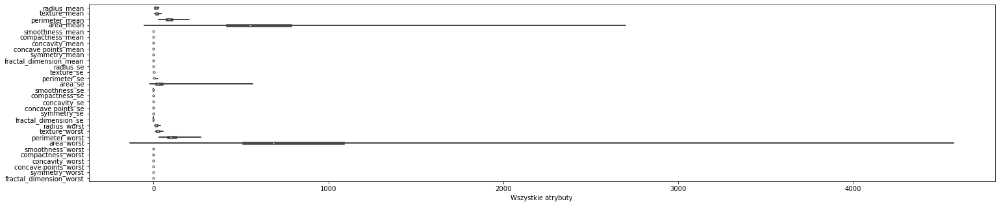

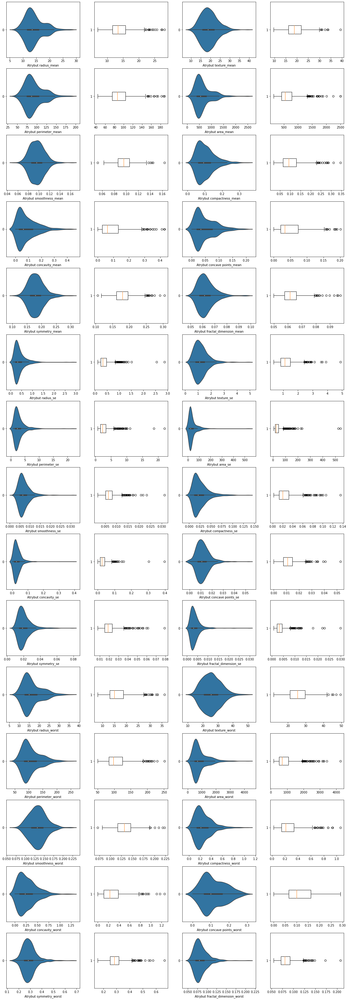

In [185]:
plt.figure(figsize=(25,5))
sns.violinplot(data = plot_data, orient="h")
plt.xlabel("Wszystkie atrybuty")
plt.show()

plt.figure(figsize=(20,60))
columns = plot_data.shape[1]
for atr in range(columns):
    plt.subplot(15, 4, (2 * atr)  + 1)
    sns.violinplot(data = plot_data.iloc[:, atr], orient="h")
    plt.xlabel(f"Atrybut {plot_data.columns[atr]}")
    
    plt.subplot(15, 4, (2 * atr + 1) + 1)
    plt.boxplot(x=plot_data.iloc[:, atr], vert = False)
    
plt.show()

Zakre zmienności atrybutów jest bardzo różnorodny. Atrybuty *smoothness_mean*, *smoothness_mean*, *compactness_mean*, *symmetry_mean*, *fractal_dimension_mean*, *smoothness_se*, *compactness_se*, *symmetry_se*, *fractal_dimension_se*, *smoothness_worst*, *compactness_worst*, *symmetry_worst*, *fractal_dimension_worst* zmieniają się w bardzo wąskim zakresie od 0 do 2. Natomiast reszta atrybutów *radius_mean*, *texture_mean*, *perimeter_mean*, *area_mean*, *area_se*, *radius_worst*, *texture_worst*, *perimeter_worst*, *area_worst* zmienienia się w zakresie od 0 do 4254. Dodatkowo znacząca większość atrybutów ma rozkład jednomodalny, prawoskośny (dodatnioskośny). Dodatkowo wiele atrybutów charakteryzuje występowanie tzw. "długiego ogona", czyli posiadanie znaczącej części rozkładu oddalonej od najczęściej występujących wartości (mody). Utrudnia to sklasyfikowanie niektórych próbek jako wartości oddalonych w przypadku taki atrybutów jak przykładowo *permiterer_worst*. Niemniej jednak atrybuty *area_se*, *concavity_se*, *radius_se* z pewnością posiadają wartości odbiegające od przeciętnych wartości.

**Analiza atrybutów z odniesieniem do diagnozy:** <a name="KD"></a>

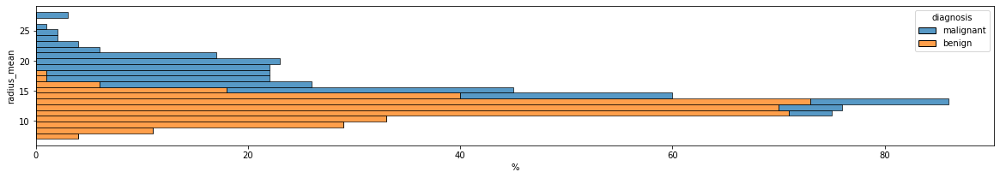

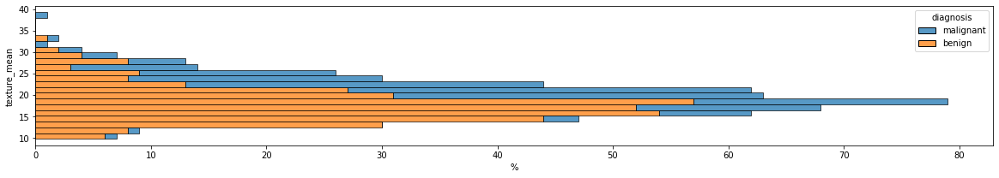

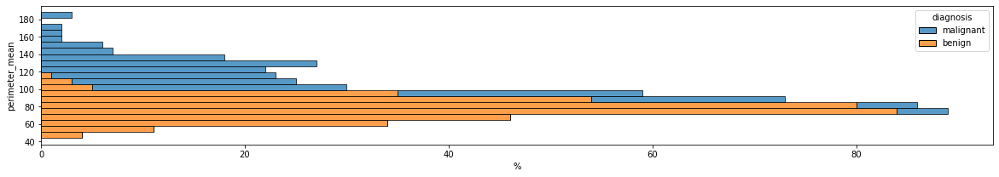

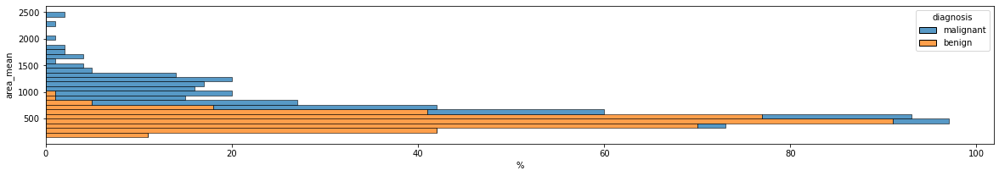

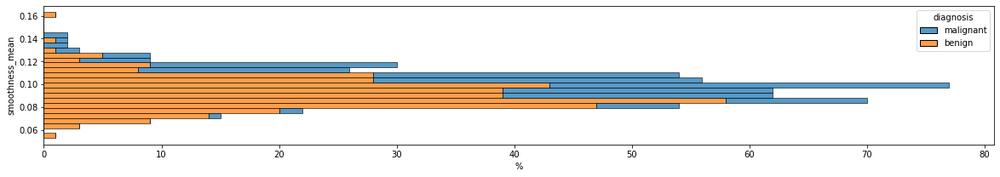

...

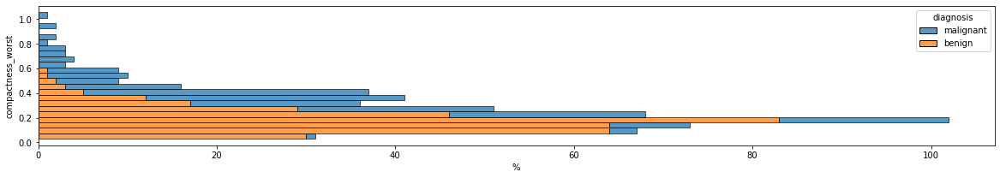

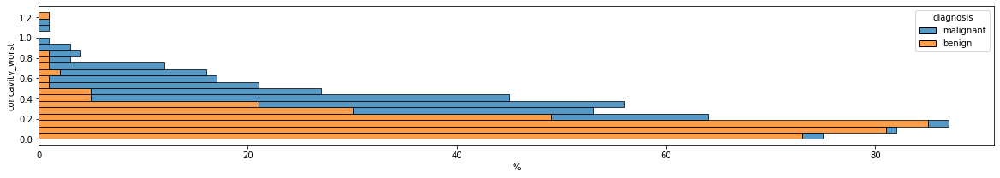

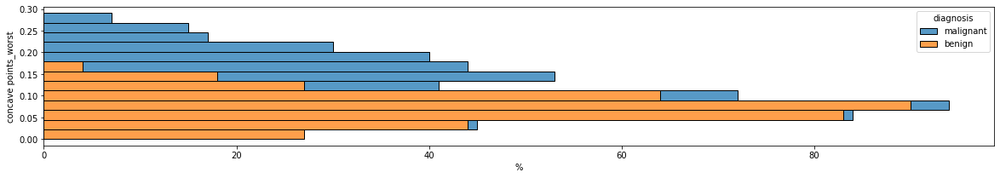

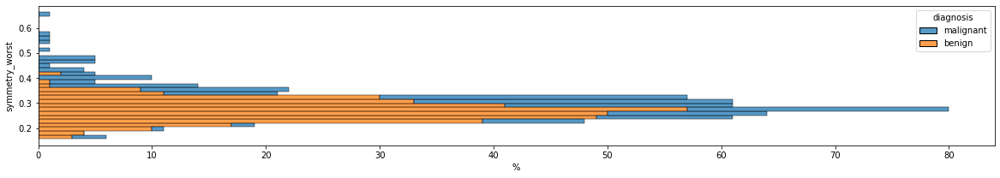

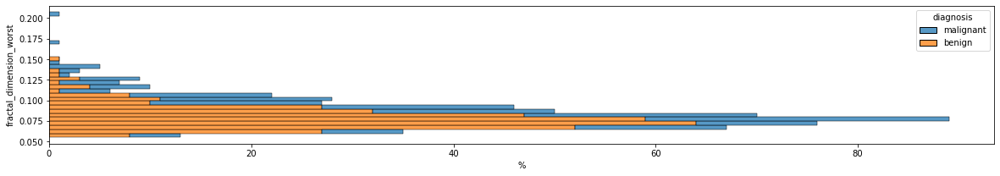

In [186]:
for col in plot_data.columns:
    plt.figure(figsize=(20,3))
    sns.histplot(y = plot_data[col], hue=data['diagnosis'], multiple="stack")
    plt.xlabel("%")
    plt.show()

Zgodnie z przewidywaniami większość atrybutów nie wykazuje bezpośredniego wpływu na wynik końcowy. Większość słupków histogramu dla tych atrybutów jest podzielona pomiędzy dwa typy diagnozy. Niemniej jednak występują atrybuty, których wartości mogą pozwalać na zwiększenie prawdopodobieństwa prawidłowego oszacowania, typu choroby. Przykładowo dla atrybutu "radious_mean" wszystkie próbki z wartością powyżej 18 posiadają złośliwy typ raka. Jednakże niewielka liczebność tego rodzaju próbek może być przyczyną takiego stanu rzeczy, więc nie jest możliwe potwierdzenie tej hipotezy.

**Korelacja danych:** <a name="KD"></a>

**Macierz:** <a name="M"></a>

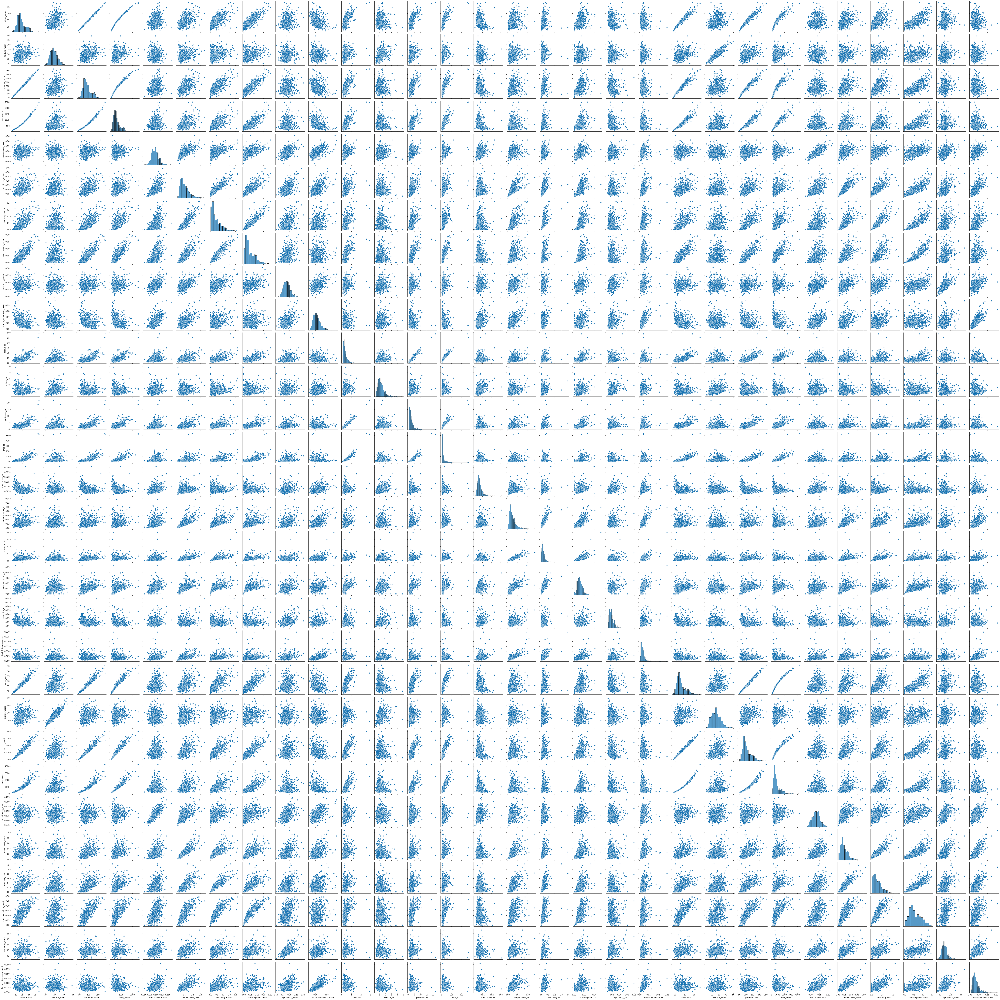

In [187]:
# Macierz atrybutów
sns.pairplot(plot_data, kind="scatter")
plt.show()

**Mapa ciepła:** <a name="MC"></a>

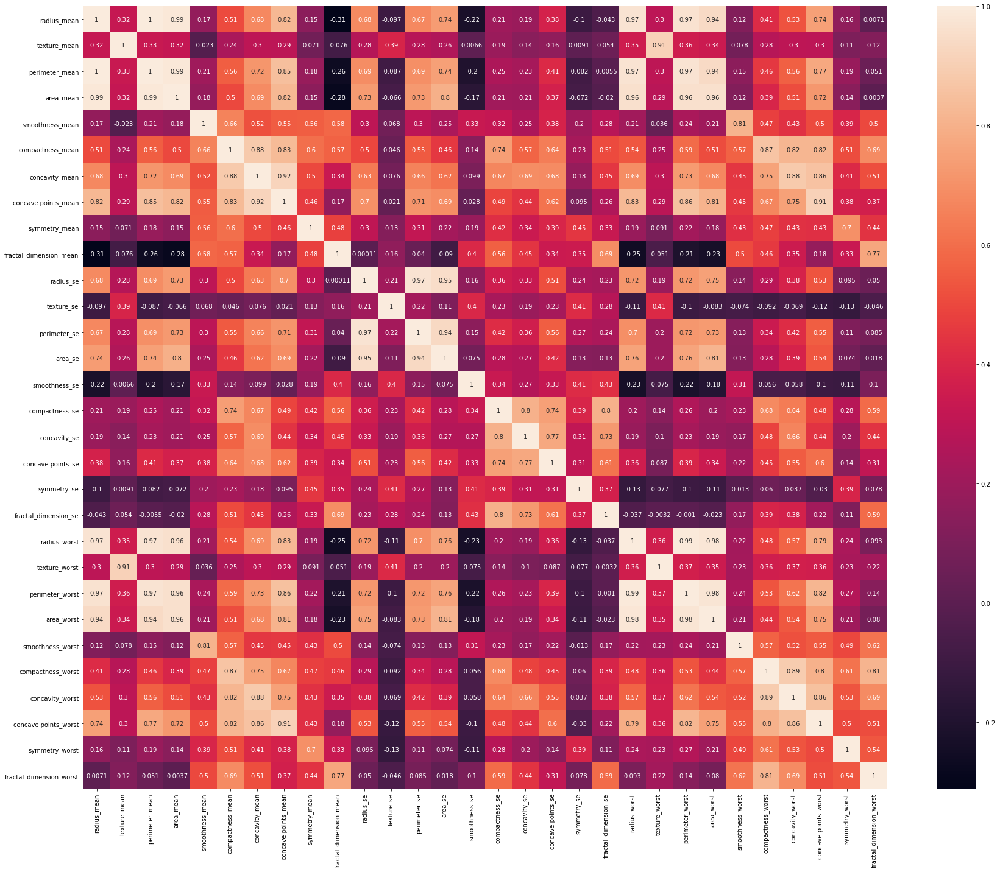

In [188]:
# Mapa ciepła
plt.figure(figsize=(25,20))
sns.heatmap(plot_data.corr(), annot=True)
plt.tight_layout()
plt.show()

**Wnioski:** <a name="W2"></a>

Macierz korelacji i macierz ciepła pozwala stwierdzić, że występuje wiele atrybutów, które są ze sobą bardzo skorelowane liniowo. Przykładowo pary atrybutów: *radius_worst* - *perimeter_worst* i *area_mean* - *radius_mean* mają korelacje na poziomie aż 0.99. W takim wypadku jednoczesne analizowanie obu tych atrybutów nie jest potrzebne. Dodatkowo znacząca większość atrybutów jest skorelowana ze sobą dodatnio, a tylko niewiele z nich posiada ujemną wartość i żadna z tych wartości nie jest wystarczająco bliska -1, żeby uznać parę atrbutów za skorelowaną ujemnie.

**Najbardziej skorelowane atrybuty:**

In [189]:
from itertools import combinations

threshold = 0.75

pairs = list(combinations(plot_data.columns, 2))
corr_coefs = {}

for pair in pairs:
    corr_coef = np.corrcoef(plot_data[pair[0]], plot_data[pair[1]])
    corr_coefs[pair] = abs(corr_coef[0, 1])

corr_coefs = dict(sorted(corr_coefs.items(), key=lambda item: -item[1]))

for key, i in zip(corr_coefs, range(len(corr_coefs))):
    if corr_coefs[key] < threshold:
        break
    print(f"Współczynnik: {round(corr_coefs[key], 4)} < - Dla {key}")

Współczynnik: 0.9979 < - Dla ('radius_mean', 'perimeter_mean')
Współczynnik: 0.9937 < - Dla ('radius_worst', 'perimeter_worst')
Współczynnik: 0.9874 < - Dla ('radius_mean', 'area_mean')
Współczynnik: 0.9865 < - Dla ('perimeter_mean', 'area_mean')
Współczynnik: 0.984 < - Dla ('radius_worst', 'area_worst')
Współczynnik: 0.9776 < - Dla ('perimeter_worst', 'area_worst')
Współczynnik: 0.9728 < - Dla ('radius_se', 'perimeter_se')
Współczynnik: 0.9704 < - Dla ('perimeter_mean', 'perimeter_worst')
Współczynnik: 0.9695 < - Dla ('radius_mean', 'radius_worst')
Współczynnik: 0.9695 < - Dla ('perimeter_mean', 'radius_worst')
Współczynnik: 0.9651 < - Dla ('radius_mean', 'perimeter_worst')
Współczynnik: 0.9627 < - Dla ('area_mean', 'radius_worst')
Współczynnik: 0.9592 < - Dla ('area_mean', 'area_worst')
Współczynnik: 0.9591 < - Dla ('area_mean', 'perimeter_worst')
Współczynnik: 0.9518 < - Dla ('radius_se', 'area_se')
Współczynnik: 0.9415 < - Dla ('perimeter_mean', 'area_worst')
Współczynnik: 0.9411 <

Text(0.5, 1.0, 'Współczynniki o najwięksej korelacji')

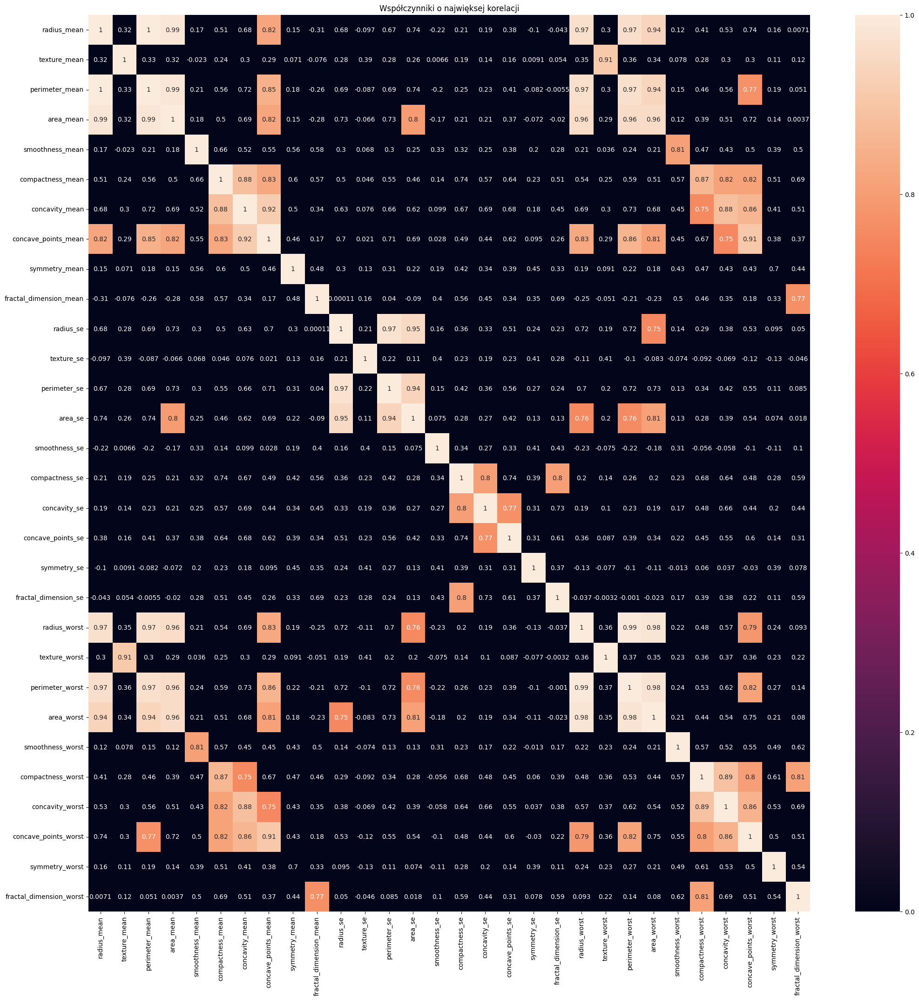

In [6]:
data_corr = plot_data.corr()

data_corr - (np.identity(plot_data.columns.shape[0]) * 0.99)

th = abs(data_corr) * (abs(data_corr) >= 0.75)

plt.figure(figsize=(25,25))
ax = sns.heatmap(th, annot=data_corr)
ax.set_title("Współczynniki o najwięksej korelacji")

**Bibliografia:** <a name="BIB"></a>

* https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data
* materiały z wykładu